# Proyecto final Talento Tech

**Estudiantes:**

Juan Sebastian Ladino Mendieta

Lizeth Daniela Castellanos Alfonso


# Punto 6
Desplegar un modelo de machine learning de clasificación spam/no-spam con técnicas de procesamiento de lenguaje natural y count vectorizer 

*   Caso de estudio: https://www.kaggle.com/datasets/mfaisalqureshi/spam-email


In [2]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:

df_nlp = pd.read_csv('data/Punto-6/spam.csv')

df_nlp.head()

,Category,Message
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."


In [4]:
df_nlp = df_nlp.rename(columns={'Category': 'Label', 'Message': 'EmailText'})
df_nlp.head()

,Label,EmailText
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."


In [6]:
df_nlp['Label'].unique()

array(['ham', 'spam'], dtype=object)

In [9]:
nan_count = df_nlp['Label'].isna().sum()
print(f"Número de valores NaN en 'Label': {nan_count}")

Número de valores NaN en 'Label': 0


In [10]:
nan_count = df_nlp['EmailText'].isna().sum()
print(f"Número de valores NaN en 'EmailText': {nan_count}")

Número de valores NaN en 'EmailText': 0


In [11]:
df_nlp['EmailText'] = df_nlp['EmailText'].str.lower().str.strip()

count_vector = CountVectorizer(stop_words='english', ngram_range=(1, 1))
x = count_vector.fit_transform(df_nlp['EmailText'])
y = df_nlp['Label']  

In [12]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [13]:
model = MultinomialNB(alpha=0.1)
model.fit(X_train, y_train)

MultinomialNB(alpha=0.1)

In [16]:

y_pred = model.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')  


print(f'Accuracy: {accuracy}')
print(f'F1 Score: {f1}')


Accuracy: 0.9847533632286996
F1 Score: 0.9849006034765059


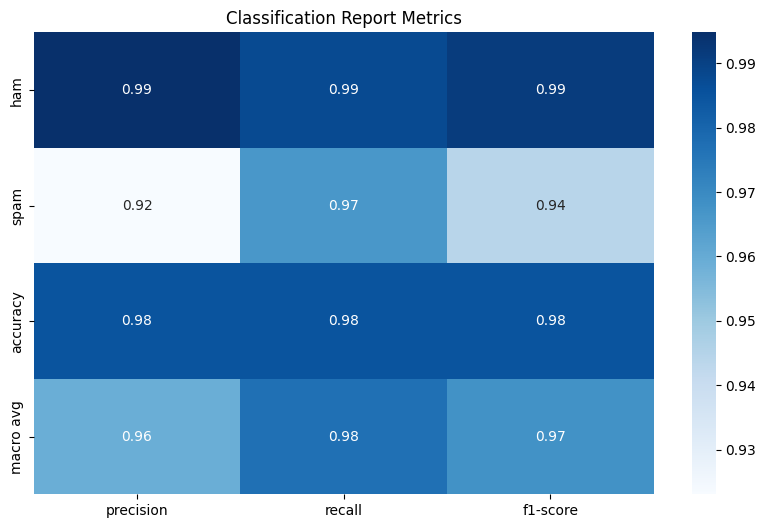

In [17]:
report = classification_report(y_test, y_pred, output_dict=True)

df_report = pd.DataFrame(report).transpose()
plt.figure(figsize=(10, 6))
sns.heatmap(df_report[['precision', 'recall', 'f1-score']].iloc[:-1, :], annot=True, cmap='Blues')
plt.title('Classification Report Metrics')
plt.show()

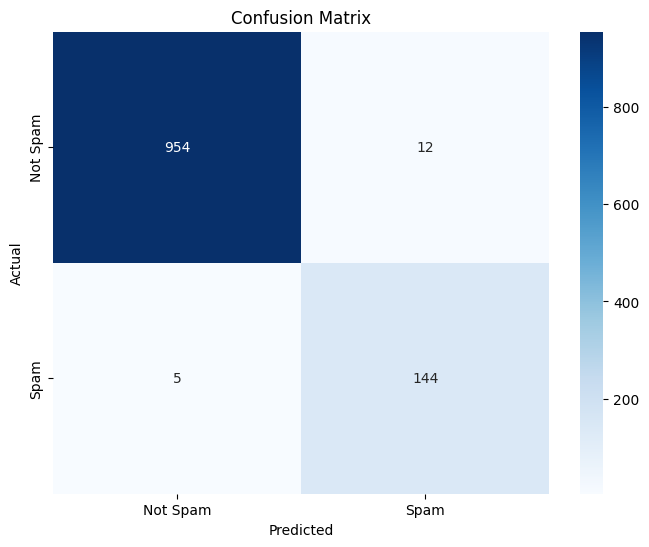

In [18]:

conf_matrix = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8,6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Spam', 'Spam'], yticklabels=['Not Spam', 'Spam'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Punto 7:

Despliegue mediante Transformers por Hugging Face 4 pipelines de tareas relacionadas con análisis de sentimiento, resumen de texto, clasificación de documentos y traducción automática.

#### 1. Análisis de Sentimiento

In [1]:
from transformers import pipeline


sentiment_pipeline = pipeline("sentiment-analysis")

result = sentiment_pipeline("We want to avoid any criticism of the way we administer this liberal gift [of money you have given for the Christians in Jerusalem]. For we are taking pains to do what is right, not only in the eyes of the Lord but also in the eyes of men.")
print(result)


/home/juanse/miniconda3/envs/proyecto/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-09-03 01:24:37.573939: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-09-03 01:24:37.577221: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-09-03 01:24:37.586335: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-03 01:24:37.603053: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-03 

[{'label': 'POSITIVE', 'score': 0.996343195438385}]


#### 2. Resumen de Texto

In [2]:

summarization_pipeline = pipeline("summarization")

text = "We want to avoid any criticism of the way we administer this liberal gift [of money you have given for the Christians in Jerusalem]. For we are taking pains to do what is right, not only in the eyes of the Lord but also in the eyes of men."
summary = summarization_pipeline(text)
print(summary)


No model was supplied, defaulted to google-t5/t5-small and revision d769bba (https://huggingface.co/google-t5/t5-small).
Using a pipeline without specifying a model name and revision in production is not recommended.
All PyTorch model weights were used when initializing TFT5ForConditionalGeneration.

All the weights of TFT5ForConditionalGeneration were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 200, but your input_length is only 57. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=28)
I0000 00:00:1725344685.191180   11336 service.cc:146] XLA service 0x55f801212490 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
I0000 00:00:17253446

[{'summary_text': 'we want to avoid criticism of the way we administer this liberal gift . we are taking pains to do what is right, not only in the eyes of the Lord .'}]


#### 3. Clasificación de Documentos

In [3]:
classification_pipeline = pipeline("text-classification")

result = classification_pipeline("We want to avoid any criticism of the way we administer this liberal gift [of money you have given for the Christians in Jerusalem]. For we are taking pains to do what is right, not only in the eyes of the Lord but also in the eyes of men.")
print(result)

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.
All PyTorch model weights were used when initializing TFDistilBertForSequenceClassification.

All the weights of TFDistilBertForSequenceClassification were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertForSequenceClassification for predictions without further training.


[{'label': 'POSITIVE', 'score': 0.996343195438385}]


#### 4. Traducción Automática

In [4]:
translation_pipeline = pipeline("translation", model="Helsinki-NLP/opus-mt-en-es")

translated_text = translation_pipeline("We want to avoid any criticism of the way we administer this liberal gift [of money you have given for the Christians in Jerusalem]. For we are taking pains to do what is right, not only in the eyes of the Lord but also in the eyes of men.")
print(translated_text)

All model checkpoint layers were used when initializing TFMarianMTModel.

All the layers of TFMarianMTModel were initialized from the model checkpoint at Helsinki-NLP/opus-mt-en-es.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFMarianMTModel for predictions without further training.
/home/juanse/miniconda3/envs/proyecto/lib/python3.12/site-packages/transformers/models/marian/tokenization_marian.py:175: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")


[{'translation_text': 'Queremos evitar cualquier crítica de la forma en que administramos este don liberal [del dinero que has dado a los cristianos en Jerusalén].Porque estamos haciendo todo lo que es correcto, no sólo a los ojos del Señor, sino también a los ojos de los hombres.'}]


# Punto 8:

Diseñe un asistente virtual personalizado con OpenAI y Langchain. En este asistente se va a pasar como contexto el siguiente informe relacionado a los trabajos con Inteligencia Artificial.

*   Documento en PDF: https://www.oecd-ilibrary.org/docserver/9c86de40-en.pdf?expires=1724622592&id=id&accname=guest&checksum=D11C5D06FA533A0A144EC9FCB4796CF7

# Punto 9:

Realice un procesamiento de imágenes. En este sentido, puede tomar 5 imágenes de su preferencia (Preferiblemente a color y en .jpeg ) para aplicar los siguientes métodos.

*   Realice un histograma para analizar la intensidad de los colores RGB
*   Obtenga el negativo de cada una de las imágenes
*   Obtenga el umbral de cada imagen
*   Obtenga los bordes de las imágenes (Con la función de sobel)
*   Aplique la detección de contornos con la función de Canny

In [87]:
from skimage import color
import matplotlib.pyplot as plt

In [88]:
img1 = plt.imread('./data/Punto-9/1-bird.jpg')
img2 = plt.imread('./data/Punto-9/2-cat.jpg')
img3 = plt.imread('./data/Punto-9/3-leaf.jpg')
img4 = plt.imread('./data/Punto-9/4-electronics.jpg')
img5 = plt.imread('./data/Punto-9/5-zebra.jpeg')
images = [img1, img2, img3, img4, img5]

### Intensidad de los colores RGB


In [108]:
def show_colors(image): 
    img_r = image[:, :, 0]
    img_g = image[:, :, 1]
    img_b = image[:, :, 2]
    
    fig, axes = plt.subplots(4, 2, figsize=(10, 20))
    axes[0, 0].imshow(image)
    axes[0, 0].set_title("Original")
    
    axes[0, 1].hist(img_r.ravel(), bins=256, color='red', alpha=0.5)
    axes[0, 1].hist(img_g.ravel(), bins=256, color='green', alpha=0.5)
    axes[0, 1].hist(img_b.ravel(), bins=256, color='blue', alpha=0.5)
    axes[0, 1].set_title("RGB")
    
    axes[1, 0].imshow(img_r, cmap='Reds')
    axes[1, 0].set_title("Red")
    
    axes[1, 1].hist(img_r.ravel(), bins=256, color='red', alpha=0.5)
    axes[1, 1].set_title("Red")
    
    axes[2, 0].imshow(img_g, cmap='Greens')
    axes[2, 0].set_title("Green")
    
    axes[2, 1].hist(img_g.ravel(), bins=256, color='green', alpha=0.5)
    axes[2, 1].set_title("Green")
    
    axes[3, 0].imshow(img_b, cmap='Blues')
    axes[3, 0].set_title("Blue")
    
    axes[3, 1].hist(img_b.ravel(), bins=256, color='blue', alpha=0.5)
    axes[3, 1].set_title("Blue")
    plt.tight_layout()
    plt.show()

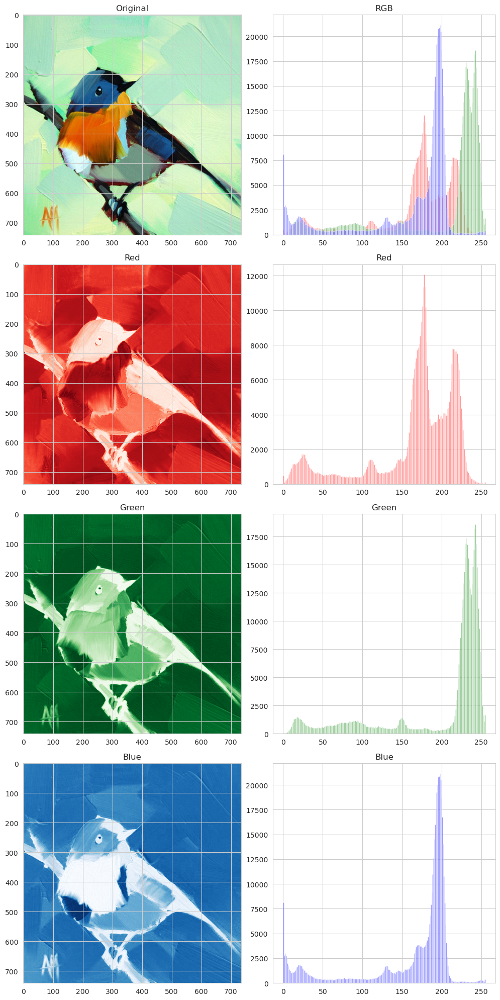

In [109]:
show_colors(img1)

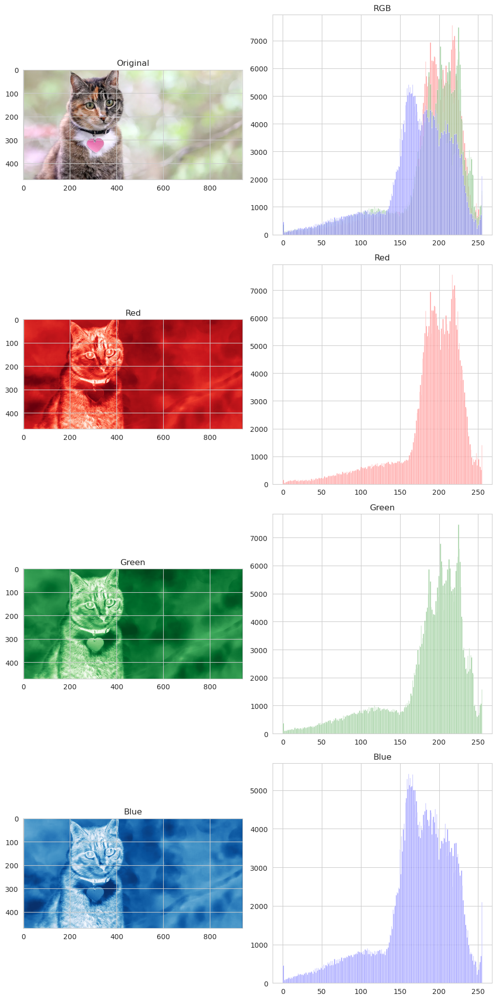

In [110]:
show_colors(img2)

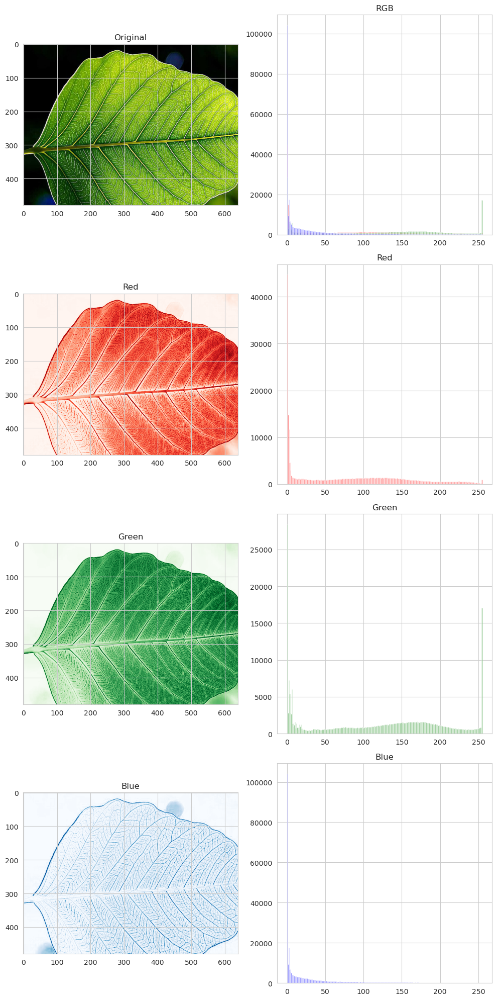

In [111]:
show_colors(img3)

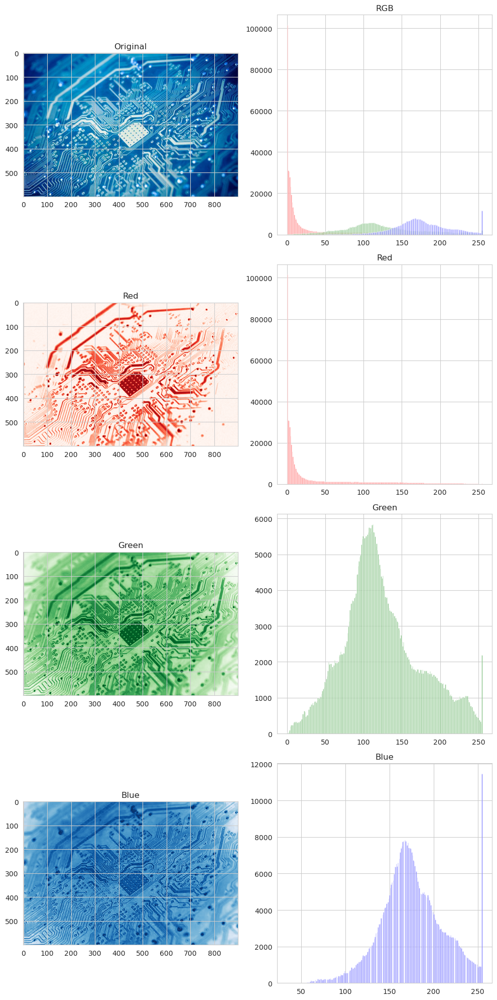

In [112]:
show_colors(img4)


### Obtenga el negativo de cada una de las imágenes


In [113]:
def show_negative(image): 
    negative = 255 - image
    
    fig, axes = plt.subplots(1, 2, figsize=(10, 20))
    axes[0].imshow(image)
    axes[0].set_title("Original")
    
    axes[1].imshow(negative)
    axes[1].set_title("Negative")
    
    plt.tight_layout()
    plt.show()

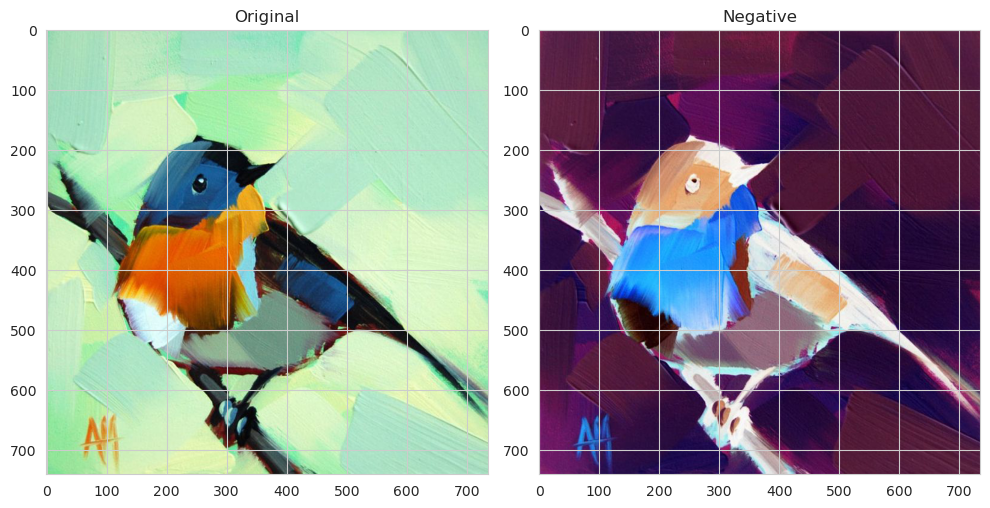

In [114]:
show_negative(img1)

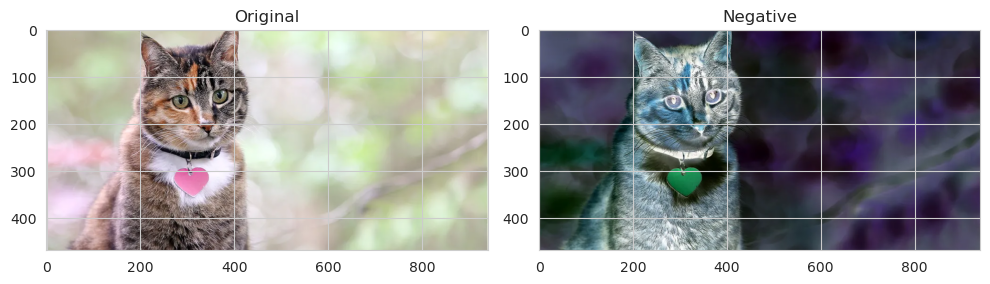

In [115]:
show_negative(img2)

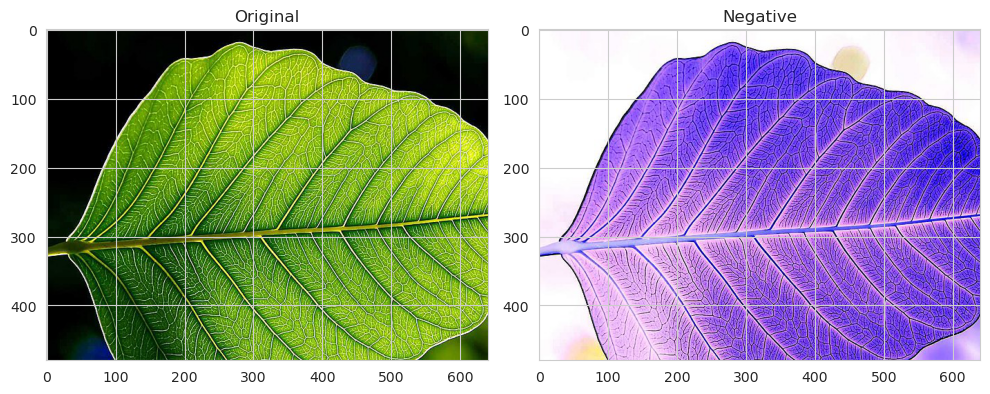

In [116]:
show_negative(img3)

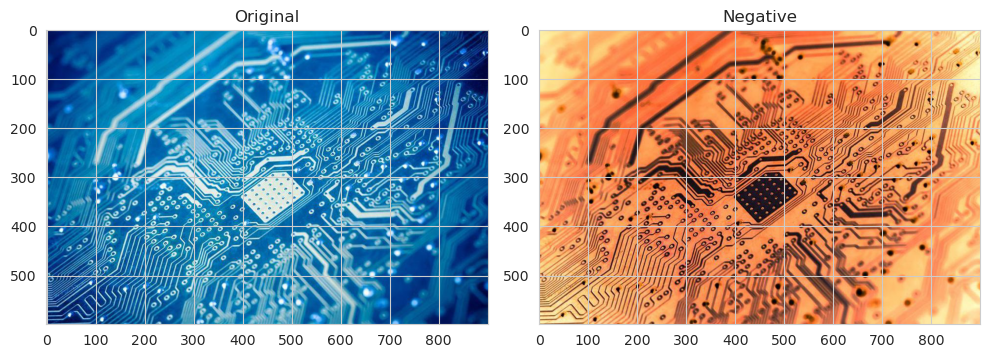

In [117]:
show_negative(img4)

### Umbral

In [119]:
def umbral(image, umbral=0.55):

    img_gray = color.rgb2gray(image)
    
    img_binaria_high = img_gray > umbral
    img_binaria_low = img_gray < umbral
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    axes[0].imshow(image)
    axes[0].set_title("Original")
    axes[0].axis('off') 

    axes[1].imshow(img_binaria_high, cmap='gray')
    axes[1].set_title(f"Greater than {umbral}")
    axes[1].axis('off')  

    axes[2].imshow(img_binaria_low, cmap='gray')
    axes[2].set_title(f"Less than {umbral}")
    axes[2].axis('off') 
    
    plt.tight_layout()
    plt.show()

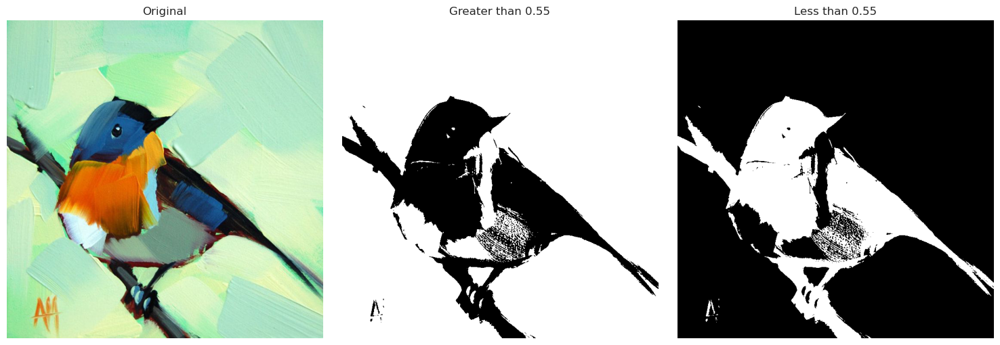

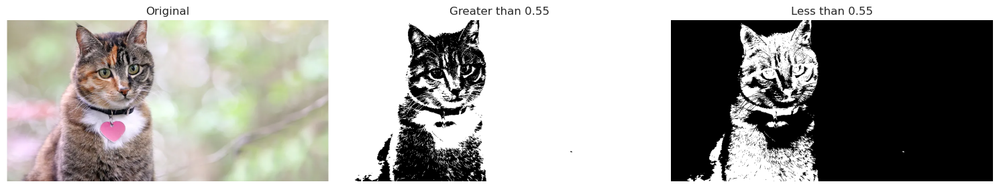

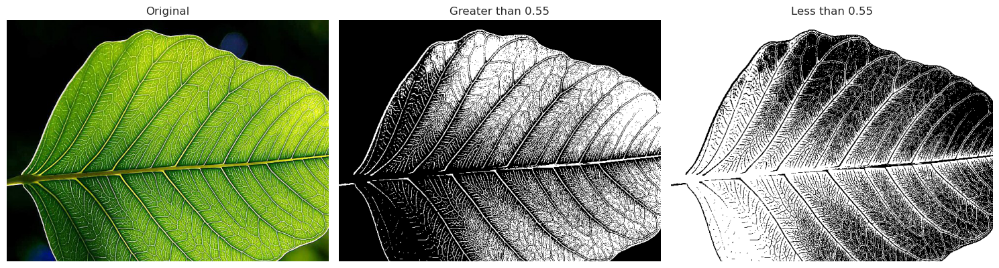

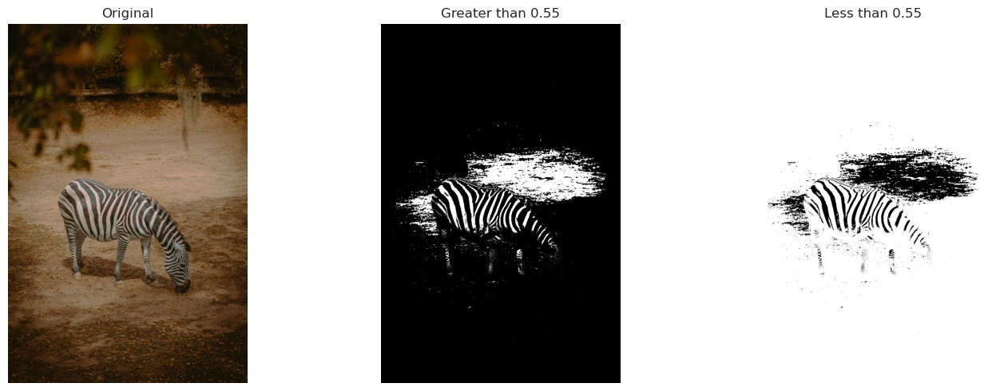

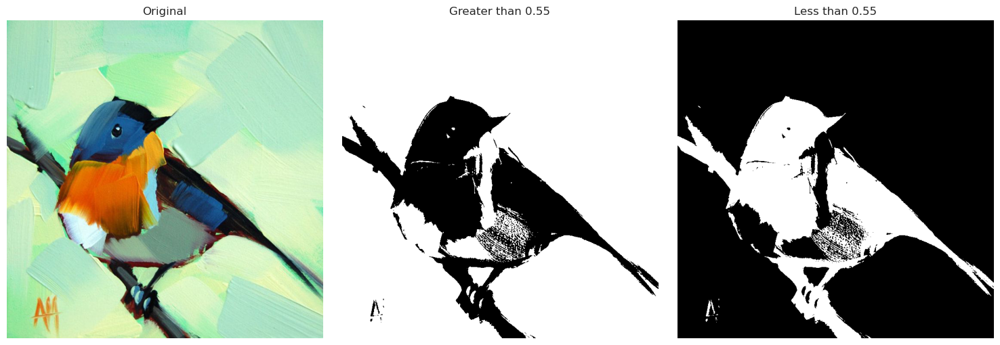

In [120]:
umbral(img1)
umbral(img2)
umbral(img3)
umbral(img5)
umbral(img1)

### Bordes

In [121]:
from skimage.filters import sobel

def borders(image): 
    
    fig, axes = plt.subplots(1, 2, figsize=(10, 20))
    axes[0].imshow(image)
    axes[0].set_title("Original")
    
    img_sobel = sobel(image)
    axes[1].imshow(img_sobel,cmap='gray')
    axes[1].set_title("Sobel")
    
    plt.tight_layout()
    plt.show()

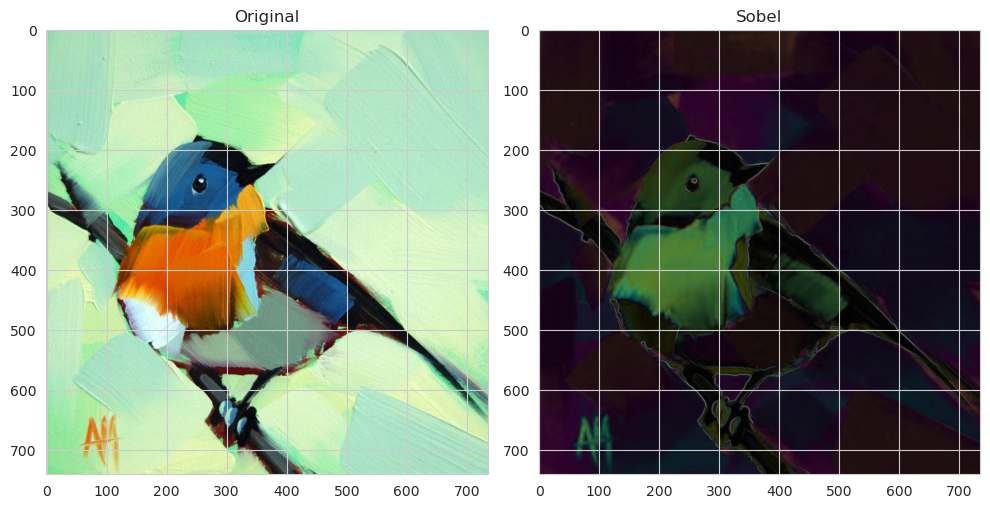

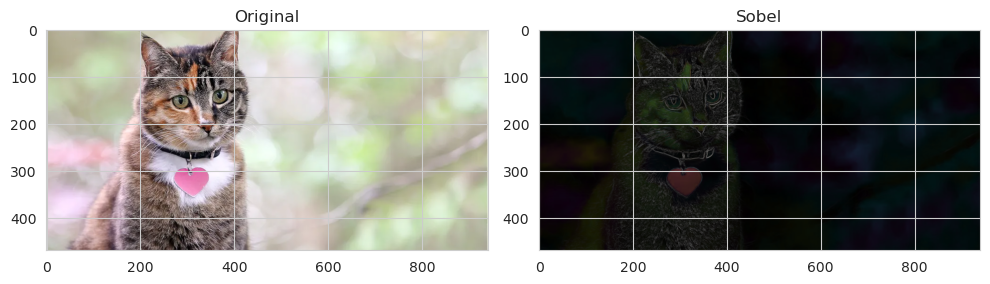

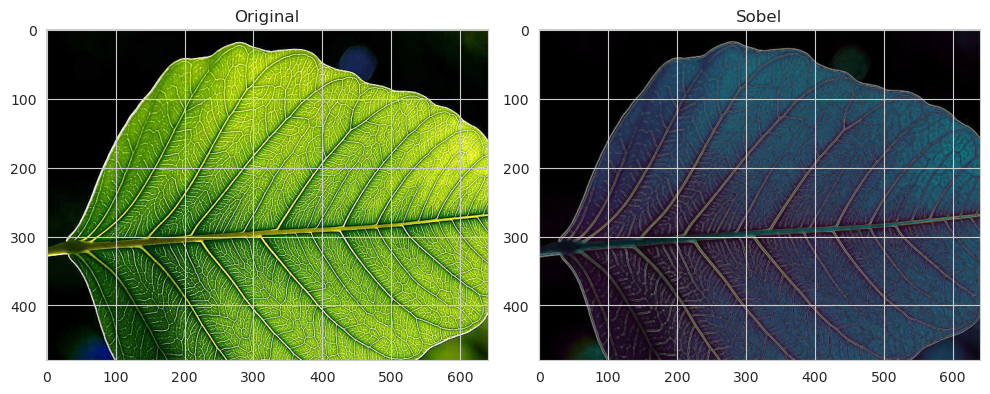

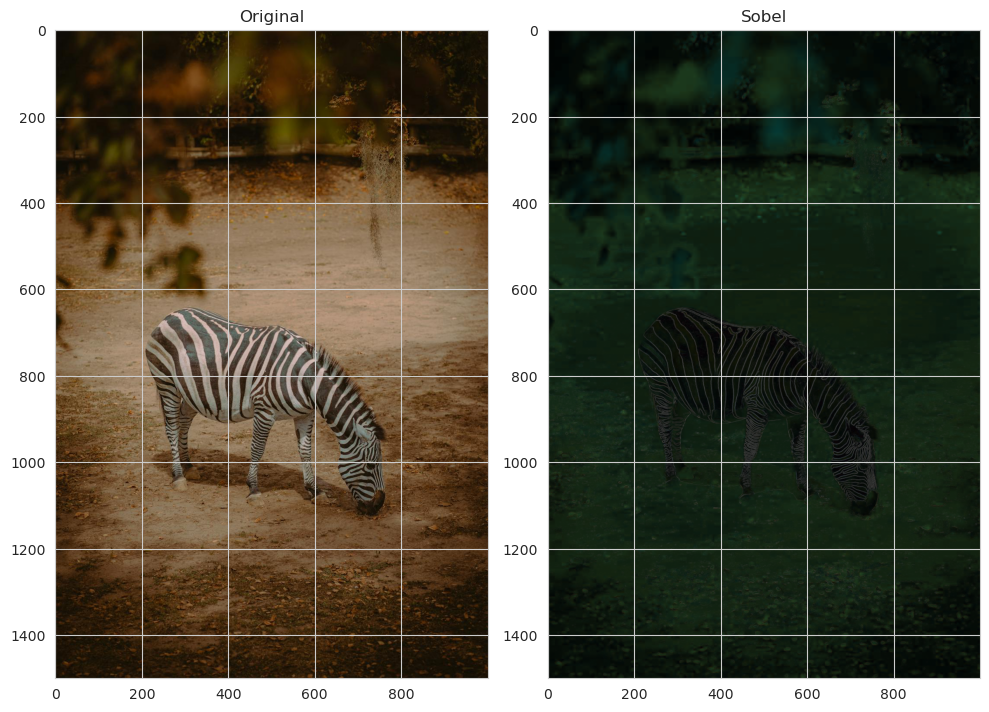

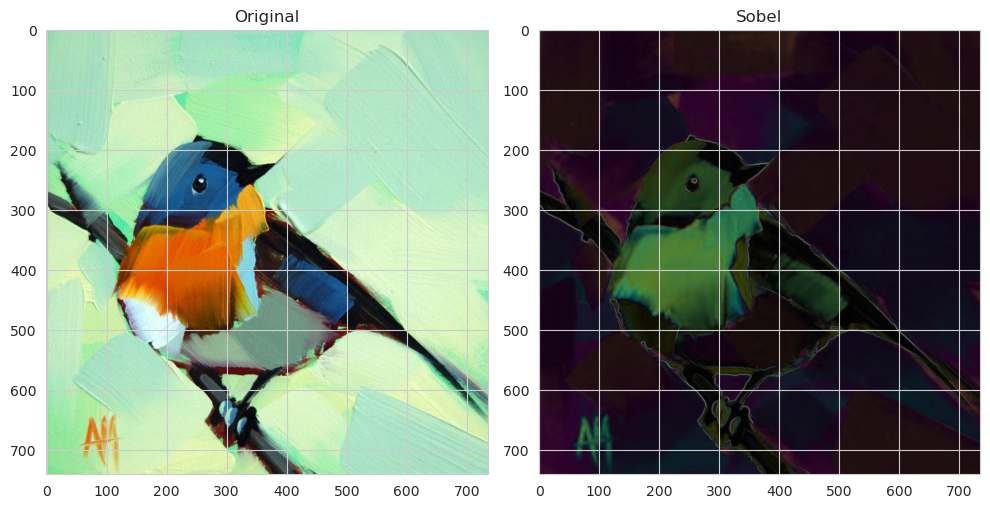

In [122]:
borders(img1)
borders(img2)
borders(img3)
borders(img5)
borders(img1)

### Detección de contornos con Canny

In [123]:
import matplotlib.pyplot as plt
from skimage.feature import canny

def show_contours(image):
    img_gray = color.rgb2gray(image)

    edges = canny(img_gray)
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    axes[0].imshow(img_gray, cmap='gray')
    axes[0].set_title("Original")
    axes[0].axis('off') 
    
    axes[1].imshow(edges, cmap='gray')
    axes[1].set_title(f"Canny")
    axes[1].axis('off') 
    
    plt.tight_layout()
    plt.show()


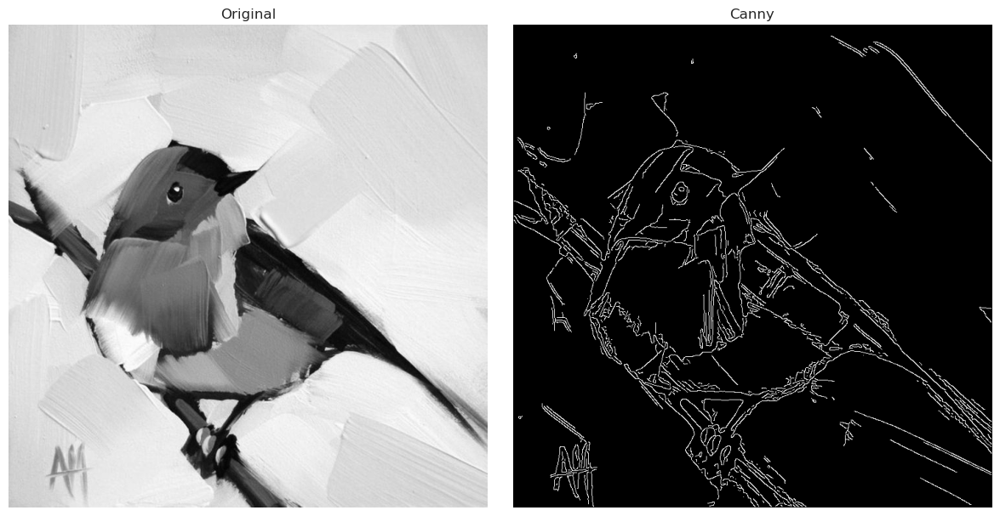

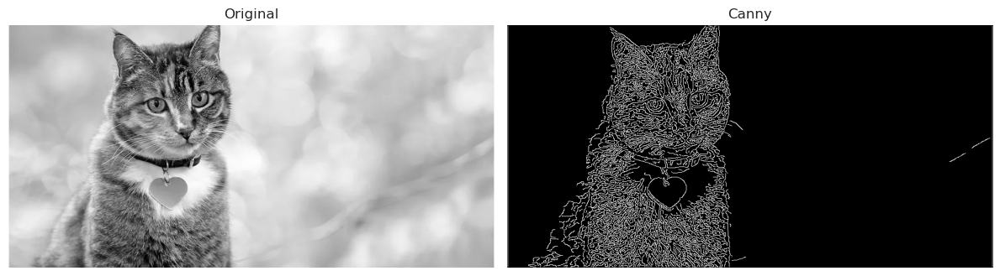

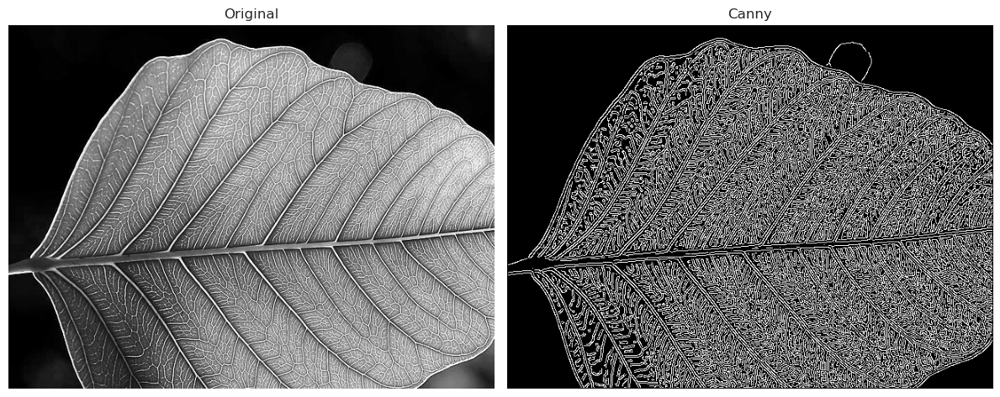

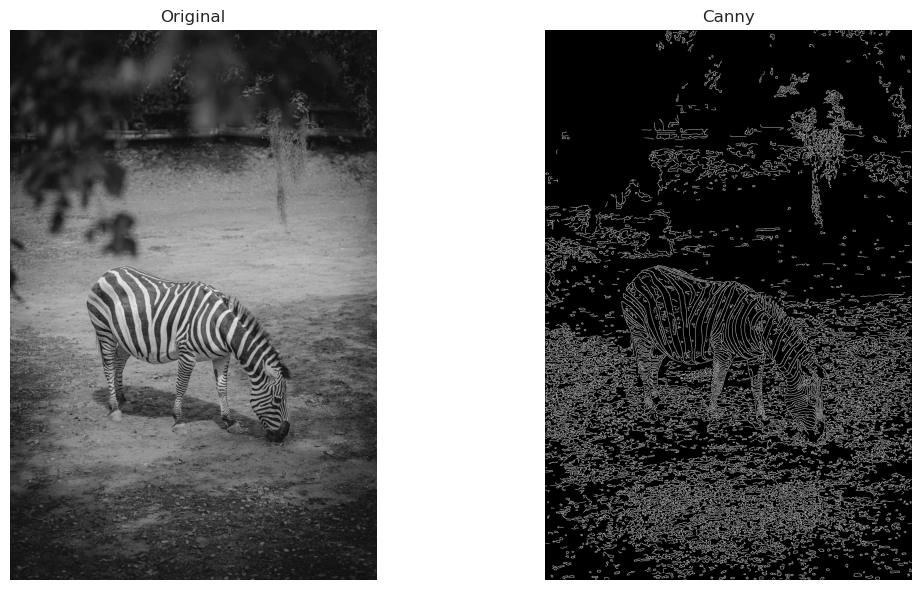

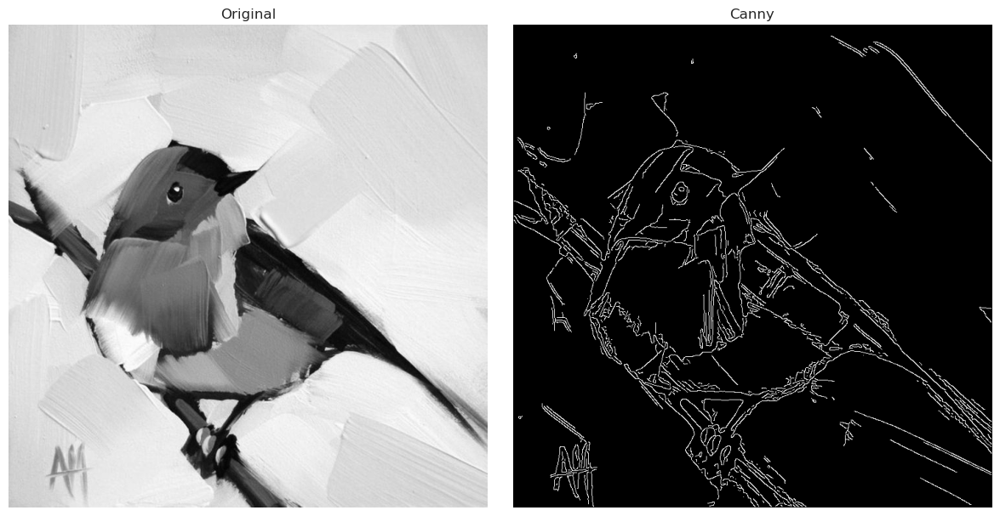

In [124]:
show_contours(img1)
show_contours(img2)
show_contours(img3)
show_contours(img5)
show_contours(img1)

# Punto 10:

 Despliegue un modelo de visión por computadora para la detección de objetos con YOLO10.

*   Para validar la evidencia de este ítem puede tomar un pantallazo a su pantalla donde se pueda verificar la detección de objetos con YOLO

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov10n.pt')  

result = model.predict(0, save=True, show=True,conf = 0.15)

result[0].show()

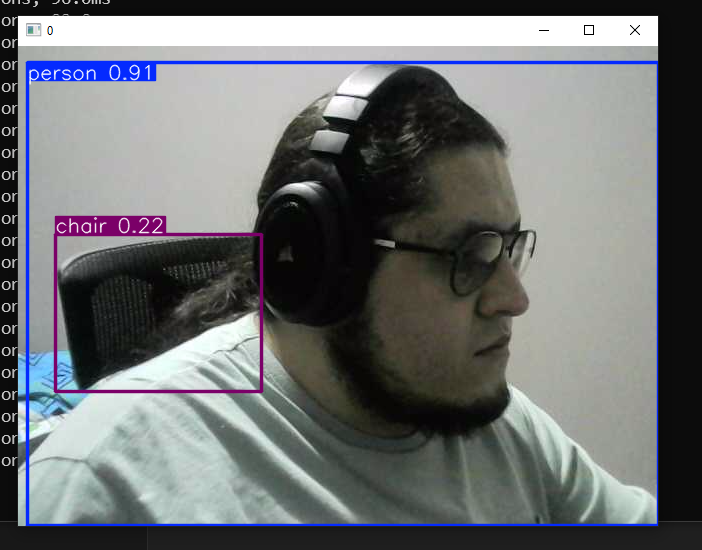